In [1]:
XENIUM_DATA_DIR = '/global/scratch/users/fosterangus/MetabTravLR/Data/Xenium'
DATASET_NAME = 'Human_Breast'
DATA_DIR = f'{XENIUM_DATA_DIR}/{DATASET_NAME}'

In [2]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

In [3]:
adata = sc.read_h5ad(f'{DATA_DIR}/adata.h5ad')
adata

AnnData object with n_obs × n_vars = 699110 × 5101
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', '_scvi_batch', '_scvi_labels', 'leiden_scVI_res_0.5', 'leiden_scVI_res_0.75', 'leiden_scVI_res_0.65', 'leiden_scVI_res_0.375', 'leiden_scVI_res_0.25', 'leiden_scVI_res_1.5', 'leiden_scVI_res_0.1', 'leiden_scVI_res_0.05', 'leiden_scVI_res_2.5', 'leiden_scVI_res_2', 'leiden_scVI_res_1'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden_scVI_res_0.05', 'leiden_scVI_res_0.05_colors', 'leiden_scVI_res_0.1', 'leiden_scVI_res_0.1_colors', 'leiden_scVI_res_0.25', 'leiden_scVI_res_0.25_colors', 'leiden_scVI_res_0.375', 'leiden_scVI_res_0.375_colors', 'leiden_scVI_res_0.5', 'leiden_scVI_res_0.5_colors', 'leiden_scVI_res_0.

/tmp/ipykernel_2565317/12019399.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, spot_size=5, show=False, title=DATASET_NAME, color='leiden_scVI_res_0.5');


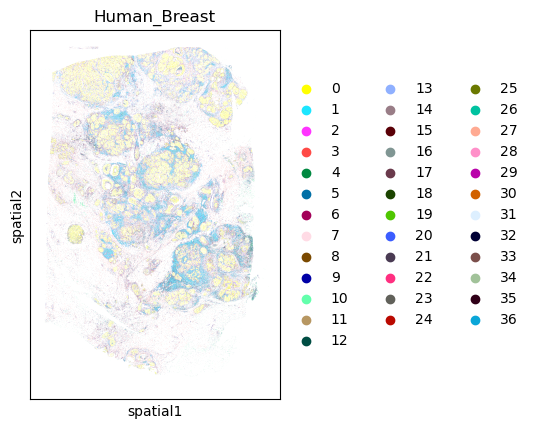

In [4]:
sc.pl.spatial(adata, spot_size=5, show=False, title=DATASET_NAME, color='leiden_scVI_res_0.5');

In [5]:
# Make sure counts layer exists
if 'counts' not in adata.layers:
    adata.layers['counts'] = adata.X.copy()

# Build log_norm layer from counts if it doesn't exist
if 'log_norm' not in adata.layers:
    adata.X = adata.layers['counts'].copy()
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata.layers['log_norm'] = adata.X.copy()
    # Restore raw counts to X
    adata.X = adata.layers['counts'].copy()

print("Layers available:", list(adata.layers.keys()))
print("X max (should be large if raw counts):", adata.X.max())
print("log_norm max (should be small, ~log scale):", adata.layers['log_norm'].max())

/tmp/ipykernel_2565317/1663927226.py:8: UserWarning: Some cells have zero counts
  sc.pp.normalize_total(adata, target_sum=1e4)


Layers available: ['counts', 'log_norm']
X max (should be large if raw counts): 79.0
log_norm max (should be small, ~log scale): 9.210441


In [6]:
# resolutions = [2.5, 2, 1.5, 1, 0.75, 0.65, 0.5, 0.375, 0.25, 0.1, 0.05]
resolutions = [2.5, 2, 1.5, 1, 0.75, 0.65, 0.5]
def res_label(res):
    return f'leiden_scVI_res_{res}'
res_labels = [res_label(res) for res in resolutions]

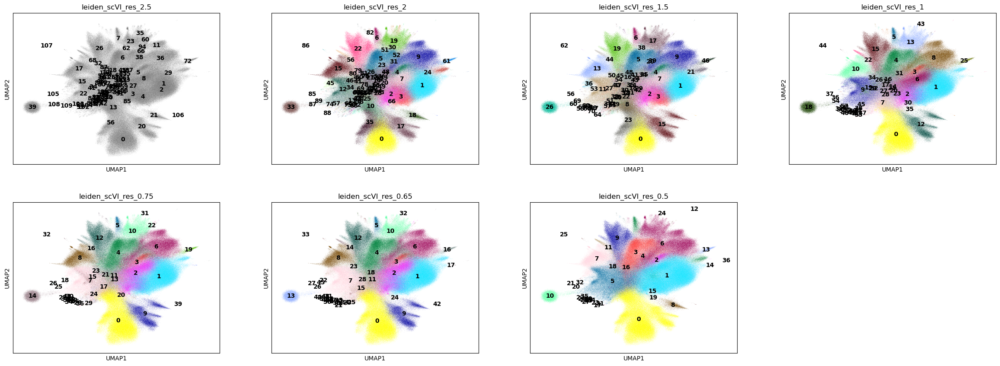

In [7]:
sc.pl.umap(adata, color=res_labels, legend_loc="on data")


RESOLUTION: leiden_scVI_res_2.5


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/t


--- Top DE genes per cluster (log_norm) ---
Cluster 0: ['CA12', 'XBP1', 'RAB11FIP1', 'TSPAN13', 'CCND1', 'SLC9A3R1', 'YWHAZ', 'SEPTIN9', 'HSPB1', 'GATA3', 'NOTCH2NLA', 'DDR1', 'PDCD4', 'CTTN', 'TIMP3']
Cluster 1: ['IL7R', 'EEF1G', 'TRBC1', 'TRAC', 'CXCR4', 'CD52', 'BIRC3', 'CD8A', 'CD3E', 'FYN', 'CD3D', 'CDKN1B', 'IKZF1', 'HECA', 'CCND2']
Cluster 2: ['IL7R', 'TRAC', 'CTLA4', 'TRBC1', 'CXCR4', 'CDKN1B', 'MIAT', 'EEF1G', 'BIRC3', 'CD52', 'SF3B1', 'FYN', 'CD247', 'PBXIP1', 'CD8A']
Cluster 3: ['EEF1G', 'IL7R', 'TRAC', 'TRBC1', 'CD52', 'CXCR4', 'CD3D', 'CD6', 'GIMAP4', 'KLRB1', 'CD3E', 'SESN3', 'GIMAP5', 'BCL11B', 'FYN']
Cluster 4: ['IL7R', 'TRBC1', 'TRAC', 'CXCR4', 'CD8A', 'CD3E', 'CD3D', 'SH2D1A', 'CD2', 'GIMAP4', 'FYN', 'CD247', 'IKZF1', 'PIK3R1', 'CD96']
Cluster 5: ['XBP1', 'PIM2', 'TENT5C', 'POU2AF1', 'SLAMF7', 'MZB1', 'MAN1A1', 'CD38', 'DUSP5', 'DERL3', 'SEL1L', 'PIK3CG', 'ATF4', 'CD79A', 'EEF1G']
Cluster 6: ['CCL2', 'THBS1', 'DCN', 'LUM', 'POSTN', 'SERPINE1', 'TIMP3', 'CCN2', 'BGN',

/tmp/ipykernel_2565317/3294693258.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
/tmp/ipykernel_2565317/3294693258.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()



--- Marker set scores and cell counts per cluster (log_norm) ---
                     Cytotoxic_CD8_score  Exhausted_CD8_score  Treg_score  \
leiden_scVI_res_2.5                                                         
0                              -0.147240            -0.141752   -0.169636   
1                               0.217438             0.231961    0.243376   
2                               0.143150             0.233677    0.302125   
3                               0.032906             0.030758    0.033966   
4                               0.150671             0.136536    0.104423   
...                                  ...                  ...         ...   
105                            -0.003153            -0.002076   -0.003653   
106                            -0.003330             0.009731   -0.004535   
107                             0.000000             0.000000    0.000000   
108                            -0.001688            -0.001092   -0.001026   
109       

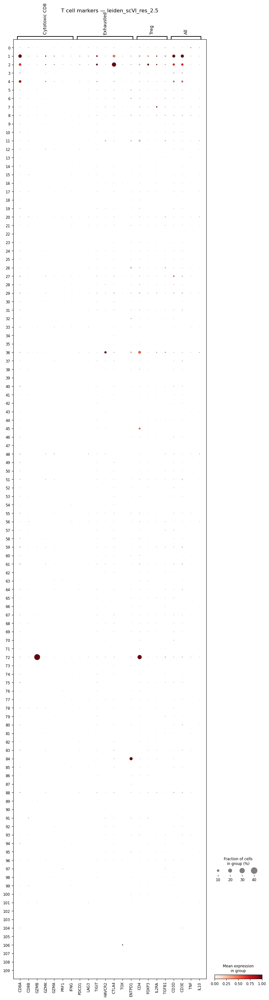


RESOLUTION: leiden_scVI_res_2


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/t


--- Top DE genes per cluster (log_norm) ---
Cluster 0: ['CA12', 'XBP1', 'RAB11FIP1', 'TSPAN13', 'CCND1', 'SLC9A3R1', 'YWHAZ', 'HSPB1', 'SEPTIN9', 'GATA3', 'NOTCH2NLA', 'DDR1', 'PDCD4', 'TIMP3', 'CTTN']
Cluster 1: ['IL7R', 'TRAC', 'TRBC1', 'EEF1G', 'CXCR4', 'CD52', 'BIRC3', 'CD8A', 'CTLA4', 'FYN', 'CDKN1B', 'CD3E', 'CD3D', 'SF3B1', 'IKZF1']
Cluster 2: ['EEF1G', 'IL7R', 'TRAC', 'TRBC1', 'CXCR4', 'CD3D', 'CD52', 'CD6', 'GIMAP4', 'KLRB1', 'CD3E', 'BCL11B', 'SESN3', 'SELL', 'CD5']
Cluster 3: ['IL7R', 'TRBC1', 'TRAC', 'CXCR4', 'CD8A', 'CD3E', 'CD3D', 'CD2', 'SH2D1A', 'FYN', 'GIMAP4', 'CD247', 'IKZF1', 'PIK3R1', 'CD5']
Cluster 4: ['XBP1', 'PIM2', 'TENT5C', 'POU2AF1', 'SLAMF7', 'MZB1', 'MAN1A1', 'CD38', 'DUSP5', 'DERL3', 'SEL1L', 'PIK3CG', 'ATF4', 'CD79A', 'EIF2AK3']
Cluster 5: ['CCL2', 'DCN', 'THBS1', 'LUM', 'POSTN', 'SERPINE1', 'TIMP3', 'CCN2', 'BGN', 'CCDC71L', 'CDKN1A', 'PIM1', 'C11orf96', 'CCN1', 'COL5A1']
Cluster 6: ['BIRC3', 'PTGS2', 'HDC', 'ACSL4', 'NAMPT', 'IL1RL1', 'CTSG', 'KIT', 'G

/tmp/ipykernel_2565317/3294693258.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
/tmp/ipykernel_2565317/3294693258.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()



--- Marker set scores and cell counts per cluster (log_norm) ---
                   Cytotoxic_CD8_score  Exhausted_CD8_score  Treg_score  \
leiden_scVI_res_2                                                         
0                            -0.145746            -0.140318   -0.167986   
1                             0.201672             0.236313    0.262682   
2                             0.033077             0.031581    0.035403   
3                             0.141572             0.131541    0.101213   
4                            -0.031424            -0.018524   -0.027413   
...                                ...                  ...         ...   
85                           -0.003153            -0.002076   -0.003653   
86                            0.000000             0.000000    0.000000   
87                           -0.001688            -0.001092   -0.001026   
88                            0.000000            -0.018124    0.000000   
89                           -0.00

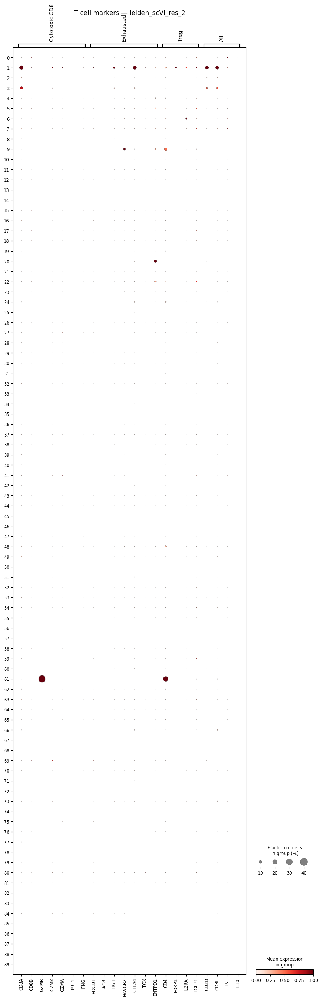


RESOLUTION: leiden_scVI_res_1.5


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/t


--- Top DE genes per cluster (log_norm) ---
Cluster 0: ['CA12', 'XBP1', 'RAB11FIP1', 'TSPAN13', 'CCND1', 'SLC9A3R1', 'YWHAZ', 'HSPB1', 'SEPTIN9', 'GATA3', 'NOTCH2NLA', 'DDR1', 'PDCD4', 'TIMP3', 'CTTN']
Cluster 1: ['IL7R', 'TRAC', 'TRBC1', 'EEF1G', 'CXCR4', 'CD52', 'BIRC3', 'CD8A', 'CTLA4', 'FYN', 'CDKN1B', 'CD3E', 'CD3D', 'SF3B1', 'IKZF1']
Cluster 2: ['EEF1G', 'IL7R', 'TRAC', 'TRBC1', 'CD3D', 'CXCR4', 'CD6', 'CD52', 'KLRB1', 'GIMAP4', 'BCL11B', 'SESN3', 'CD3E', 'KCNA3', 'GIMAP5']
Cluster 3: ['IL7R', 'TRBC1', 'TRAC', 'CXCR4', 'CD8A', 'CD3E', 'CD3D', 'CD2', 'SH2D1A', 'GIMAP4', 'FYN', 'CD247', 'CD5', 'CCND2', 'CD28']
Cluster 4: ['XBP1', 'PIM2', 'TENT5C', 'POU2AF1', 'SLAMF7', 'MZB1', 'MAN1A1', 'CD38', 'DUSP5', 'DERL3', 'SEL1L', 'PIK3CG', 'ATF4', 'CD79A', 'EIF2AK3']
Cluster 5: ['CCL2', 'DCN', 'THBS1', 'LUM', 'POSTN', 'SERPINE1', 'TIMP3', 'CCN2', 'BGN', 'CCDC71L', 'PIM1', 'CDKN1A', 'C11orf96', 'CCN1', 'COL5A1']
Cluster 6: ['BIRC3', 'PTGS2', 'HDC', 'ACSL4', 'NAMPT', 'IL1RL1', 'CTSG', 'KIT', 

/tmp/ipykernel_2565317/3294693258.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
/tmp/ipykernel_2565317/3294693258.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()



--- Marker set scores and cell counts per cluster (log_norm) ---
                     Cytotoxic_CD8_score  Exhausted_CD8_score  Treg_score  \
leiden_scVI_res_1.5                                                         
0                              -0.144086            -0.138677   -0.165899   
1                               0.196989             0.230525    0.255263   
2                               0.031881             0.030179    0.033253   
3                               0.129977             0.118468    0.090537   
4                              -0.032684            -0.019518   -0.028565   
...                                  ...                  ...         ...   
66                             -0.007874             0.000000   -0.006270   
67                              0.000000            -0.001081    0.000000   
68                              0.000000             0.000000   -0.002463   
69                             -0.001964            -0.001293    0.000000   
70        

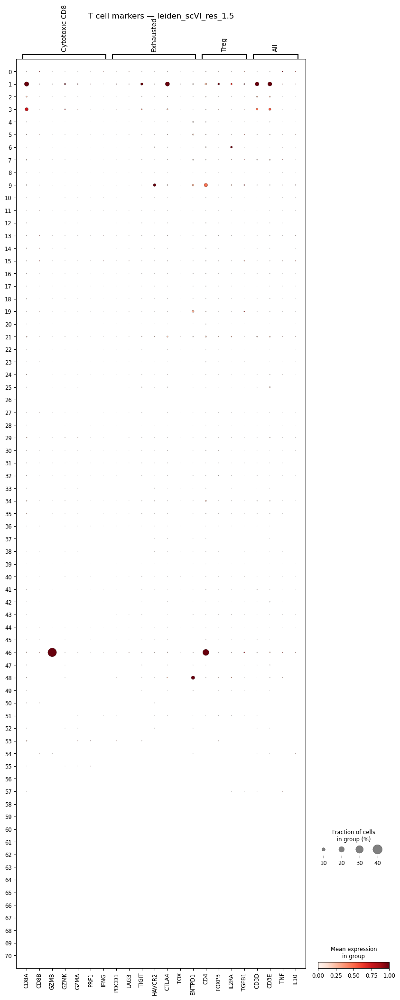


RESOLUTION: leiden_scVI_res_1


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/t


--- Top DE genes per cluster (log_norm) ---
Cluster 0: ['XBP1', 'CA12', 'RAB11FIP1', 'SLC9A3R1', 'TSPAN13', 'H3F3B', 'CCND1', 'HSPB1', 'GATA3', 'SEPTIN9', 'YWHAZ', 'IL6ST', 'NOTCH2NLA', 'HSPB8', 'WWP1']
Cluster 1: ['IL7R', 'TRAC', 'TRBC1', 'BIRC3', 'CXCR4', 'EEF1G', 'CD52', 'CD8A', 'FYN', 'CD3E', 'CTLA4', 'CD3D', 'CDKN1B', 'IKZF1', 'CD2']
Cluster 2: ['EEF1G', 'IL7R', 'TRAC', 'TRBC1', 'KLRB1', 'CD52', 'CD6', 'KCNA3', 'Human_PTEN_G129E_WT:A', 'Human_CTNNB1_S33C_ALT:G', 'SRY', 'CYP2A6', 'HPV16-E6', 'F2', 'EIF1AY']
Cluster 3: ['XBP1', 'PIM2', 'TENT5C', 'POU2AF1', 'SLAMF7', 'MZB1', 'MAN1A1', 'CD38', 'DUSP5', 'DERL3', 'SEL1L', 'PIK3CG', 'ATF4', 'CD79A', 'FNDC3B']
Cluster 4: ['CCL2', 'DCN', 'THBS1', 'LUM', 'POSTN', 'SERPINE1', 'CCN2', 'CCDC71L', 'TIMP3', 'BGN', 'PIM1', 'C11orf96', 'CCN1', 'CDKN1A', 'COL5A1']
Cluster 5: ['BIRC3', 'PTGS2', 'HDC', 'ACSL4', 'NAMPT', 'IL1RL1', 'CTSG', 'KIT', 'GATA2', 'SLC18A2', 'LIF', 'MS4A2', 'TNFRSF9', 'HPGD', 'AHR']
Cluster 6: ['MS4A1', 'CD52', 'TNFRSF13C', 'P

/tmp/ipykernel_2565317/3294693258.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
/tmp/ipykernel_2565317/3294693258.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()



--- Marker set scores and cell counts per cluster (log_norm) ---
                   Cytotoxic_CD8_score  Exhausted_CD8_score  Treg_score  \
leiden_scVI_res_1                                                         
0                            -0.133153            -0.127680   -0.151512   
1                             0.175739             0.199064    0.213438   
2                             0.028226             0.026055    0.028738   
3                            -0.033401            -0.020609   -0.029650   
4                            -0.039836            -0.023507   -0.024815   
5                            -0.032259            -0.024349   -0.000669   
6                             0.000214             0.002389    0.008910   
7                            -0.016271            -0.015526   -0.018056   
8                            -0.033264             0.001419    0.042854   
9                            -0.002675            -0.002272   -0.003446   
10                           -0.00

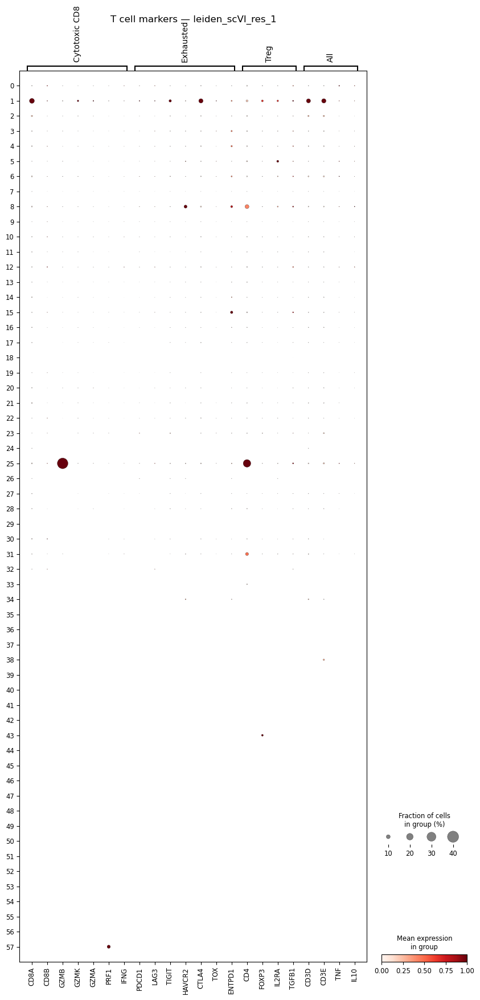


RESOLUTION: leiden_scVI_res_0.75


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/t


--- Top DE genes per cluster (log_norm) ---
Cluster 0: ['XBP1', 'RAB11FIP1', 'CA12', 'SLC9A3R1', 'TSPAN13', 'H3F3B', 'CCND1', 'HSPB1', 'GATA3', 'SEPTIN9', 'YWHAZ', 'IL6ST', 'HSPB8', 'WWP1', 'NOTCH2NLA']
Cluster 1: ['IL7R', 'TRAC', 'TRBC1', 'BIRC3', 'CXCR4', 'EEF1G', 'CD52', 'CD8A', 'FYN', 'CD3E', 'CTLA4', 'CD3D', 'CDKN1B', 'IKZF1', 'CD2']
Cluster 2: ['EEF1G', 'MS4A1', 'CD52', 'TNFRSF13C', 'P2RX5', 'CD79A', 'CD19', 'NIBAN3', 'CXCR4', 'SP140', 'CIITA', 'BCL11A', 'CD22', 'BANK1', 'BIRC3']
Cluster 3: ['XBP1', 'PIM2', 'TENT5C', 'POU2AF1', 'SLAMF7', 'MZB1', 'MAN1A1', 'CD38', 'DUSP5', 'DERL3', 'SEL1L', 'ATF4', 'PIK3CG', 'PDK1', 'CD79A']
Cluster 4: ['DCN', 'CCL2', 'POSTN', 'LUM', 'THBS1', 'TIMP3', 'SERPINE1', 'BGN', 'CCN2', 'CCDC71L', 'COL5A1', 'C11orf96', 'CCN1', 'PIM1', 'THY1']
Cluster 5: ['BIRC3', 'PTGS2', 'HDC', 'ACSL4', 'NAMPT', 'IL1RL1', 'CTSG', 'KIT', 'GATA2', 'SLC18A2', 'LIF', 'MS4A2', 'TNFRSF9', 'HPGD', 'AHR']
Cluster 6: ['C1QC', 'MS4A6A', 'CTSL', 'NAMPT', 'AIF1', 'FCGR2A', 'C5AR1', 

/tmp/ipykernel_2565317/3294693258.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
/tmp/ipykernel_2565317/3294693258.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()



--- Marker set scores and cell counts per cluster (log_norm) ---
                      Cytotoxic_CD8_score  Exhausted_CD8_score  Treg_score  \
leiden_scVI_res_0.75                                                         
0                               -0.118644            -0.113700   -0.134852   
1                                0.169157             0.191314    0.204867   
2                                0.009784             0.010122    0.014864   
3                               -0.030960            -0.019076   -0.027584   
4                               -0.034456            -0.020458   -0.021530   
5                               -0.033660            -0.025620   -0.000828   
6                               -0.032509             0.000109    0.041066   
7                               -0.003932            -0.003637   -0.004551   
8                               -0.000266            -0.000780    0.002378   
9                               -0.135777            -0.125248   -0.146995  

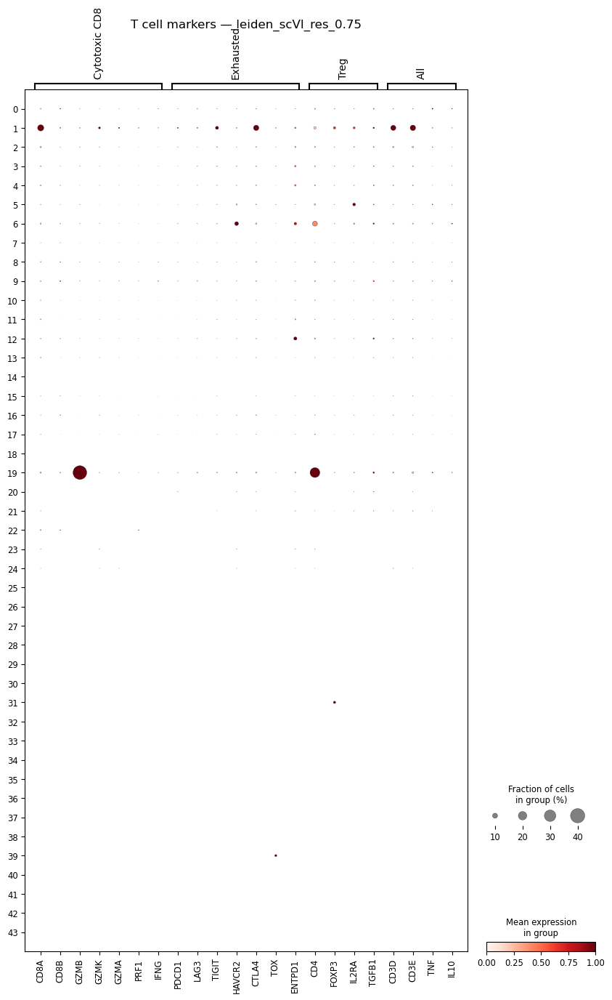


RESOLUTION: leiden_scVI_res_0.65


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/t


--- Top DE genes per cluster (log_norm) ---
Cluster 0: ['XBP1', 'RAB11FIP1', 'CA12', 'SLC9A3R1', 'TSPAN13', 'H3F3B', 'CCND1', 'HSPB1', 'GATA3', 'SEPTIN9', 'YWHAZ', 'IL6ST', 'HSPB8', 'WWP1', 'NOTCH2NLA']
Cluster 1: ['IL7R', 'TRAC', 'TRBC1', 'BIRC3', 'CXCR4', 'EEF1G', 'CD52', 'CD8A', 'FYN', 'CD3E', 'CTLA4', 'CD3D', 'CDKN1B', 'IKZF1', 'CD2']
Cluster 2: ['EEF1G', 'MS4A1', 'CD52', 'TNFRSF13C', 'P2RX5', 'CD79A', 'CD19', 'NIBAN3', 'SP140', 'CXCR4', 'CIITA', 'BCL11A', 'CD22', 'BANK1', 'PARP15']
Cluster 3: ['XBP1', 'PIM2', 'TENT5C', 'POU2AF1', 'SLAMF7', 'MZB1', 'MAN1A1', 'CD38', 'DUSP5', 'DERL3', 'SEL1L', 'PIK3CG', 'ATF4', 'FNDC3B', 'PDK1']
Cluster 4: ['DCN', 'CCL2', 'POSTN', 'LUM', 'THBS1', 'TIMP3', 'SERPINE1', 'BGN', 'CCN2', 'CCDC71L', 'COL5A1', 'C11orf96', 'CCN1', 'PIM1', 'THY1']
Cluster 5: ['BIRC3', 'PTGS2', 'HDC', 'ACSL4', 'NAMPT', 'IL1RL1', 'CTSG', 'KIT', 'GATA2', 'SLC18A2', 'LIF', 'MS4A2', 'TNFRSF9', 'HPGD', 'AHR']
Cluster 6: ['C1QC', 'MS4A6A', 'NAMPT', 'CTSL', 'AIF1', 'FCGR2A', 'C5AR1'

/tmp/ipykernel_2565317/3294693258.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
/tmp/ipykernel_2565317/3294693258.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()



--- Marker set scores and cell counts per cluster (log_norm) ---
                      Cytotoxic_CD8_score  Exhausted_CD8_score  Treg_score  \
leiden_scVI_res_0.65                                                         
0                               -0.120648            -0.115652   -0.137189   
1                                0.166583             0.188225    0.201552   
2                                0.008750             0.009334    0.014140   
3                               -0.031857            -0.019627   -0.028719   
4                               -0.034713            -0.020715   -0.021822   
5                               -0.034855            -0.026552   -0.001923   
6                               -0.032511            -0.000322    0.039944   
7                               -0.004770            -0.004311   -0.005036   
8                               -0.000668            -0.001082    0.002253   
9                               -0.135976            -0.125350   -0.147155  

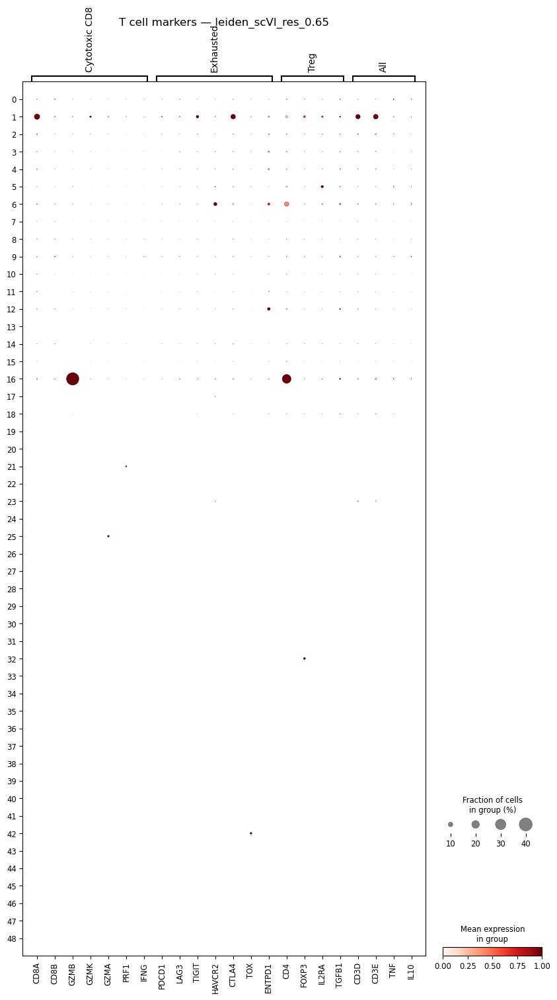


RESOLUTION: leiden_scVI_res_0.5


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/t


--- Top DE genes per cluster (log_norm) ---
Cluster 0: ['XBP1', 'RAB11FIP1', 'CA12', 'SLC9A3R1', 'H3F3B', 'HSPB1', 'TSPAN13', 'IL6ST', 'CCND1', 'GATA3', 'SEPTIN9', 'YWHAZ', 'WWP1', 'NOTCH2NLA', 'HSPB8']
Cluster 1: ['EEF1G', 'IL7R', 'TRAC', 'TRBC1', 'CD52', 'CXCR4', 'BIRC3', 'MS4A1', 'CD8A', 'CD3E', 'FYN', 'CD3D', 'CTLA4', 'IKZF1', 'SMCHD1']
Cluster 2: ['XBP1', 'PIM2', 'TENT5C', 'POU2AF1', 'SLAMF7', 'MZB1', 'MAN1A1', 'CD38', 'DUSP5', 'DERL3', 'SEL1L', 'PIK3CG', 'ATF4', 'FNDC3B', 'OGT']
Cluster 3: ['DCN', 'CCL2', 'POSTN', 'LUM', 'THBS1', 'TIMP3', 'SERPINE1', 'BGN', 'CCN2', 'CCDC71L', 'COL5A1', 'C11orf96', 'CCN1', 'PIM1', 'CDKN1A']
Cluster 4: ['BIRC3', 'PTGS2', 'HDC', 'NAMPT', 'CD83', 'ACSL4', 'CDKN1A', 'IL1RL1', 'DUSP5', 'LY75', 'CTSG', 'KIT', 'TNFRSF9', 'SLC18A2', 'GATA2']
Cluster 5: ['USP9Y', 'Human_PTEN_G129E_WT:A', 'Human_CTNNB1_S33C_ALT:G', 'HPV16-E6', 'CYP2A6', 'F2', 'HPV18-E6', 'SRY', 'EIF1AY', 'HPV16-E7', 'TBL1Y', 'Human_CTNNB1_S33C_WT:G', 'Human_FGFR3_R248H_ALT:A', 'SULT2A1', '

/tmp/ipykernel_2565317/3294693258.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
/tmp/ipykernel_2565317/3294693258.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()



--- Marker set scores and cell counts per cluster (log_norm) ---
                     Cytotoxic_CD8_score  Exhausted_CD8_score  Treg_score  \
leiden_scVI_res_0.5                                                         
0                              -0.122063            -0.116865   -0.138294   
1                               0.112681             0.126863    0.137102   
2                              -0.035668            -0.022322   -0.031724   
3                              -0.036814            -0.022697   -0.023533   
4                              -0.021472            -0.011217    0.008385   
5                              -0.004715            -0.003309   -0.003262   
6                              -0.024143            -0.002460    0.025764   
7                              -0.001010            -0.002018    0.001537   
8                              -0.103975            -0.076689   -0.091247   
9                              -0.057708            -0.044684   -0.028880   
10        

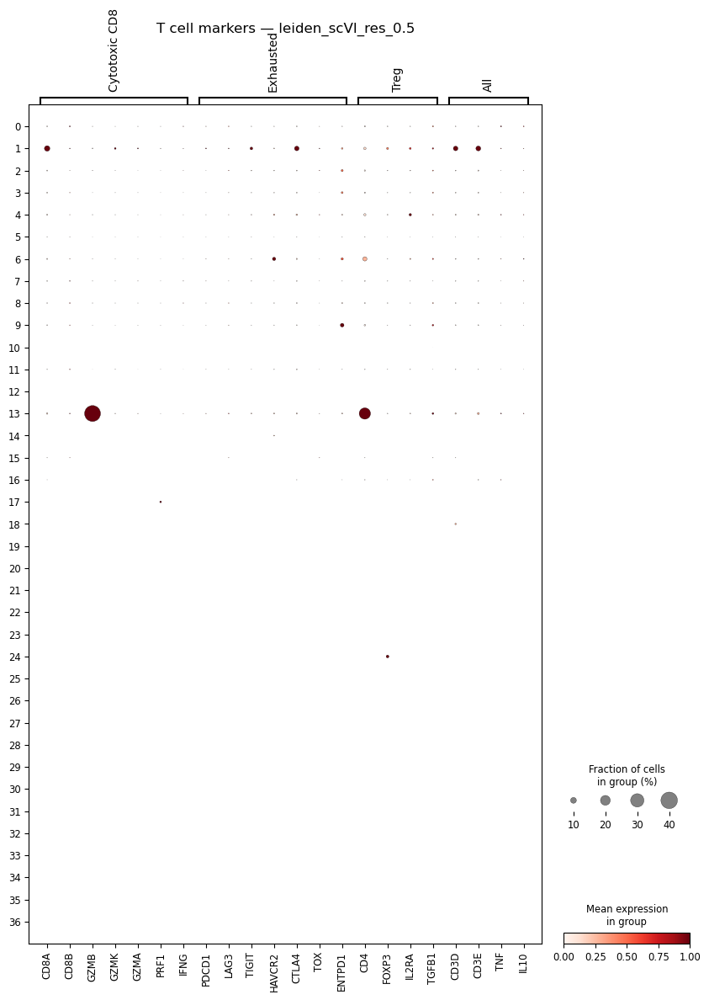

In [8]:
marker_sets = {
    'Cytotoxic_CD8': ['CD8A', 'CD8B', 'CD3D', 'CD3E', 'GZMB', 'GZMK', 'GZMA', 'PRF1', 'IFNG', 'TNF'],
    'Exhausted_CD8': ['CD8A', 'CD8B', 'CD3D', 'CD3E', 'GZMB', 'GZMK', 'PDCD1', 'LAG3', 'TIGIT', 'HAVCR2', 'CTLA4', 'TOX', 'ENTPD1'],
    'Treg': ['CD4', 'CD3D', 'CD3E', 'FOXP3', 'IL2RA', 'CTLA4', 'IL10', 'TGFB1', 'ENTPD1'],
}

marker_genes_dotplot = {
    'Cytotoxic CD8': ['CD8A', 'CD8B', 'GZMB', 'GZMK', 'GZMA', 'PRF1', 'IFNG'],
    'Exhausted': ['PDCD1', 'LAG3', 'TIGIT', 'HAVCR2', 'CTLA4', 'TOX', 'ENTPD1'],
    'Treg': ['CD4', 'FOXP3', 'IL2RA', 'TGFB1'],
    'All': ['CD3D', 'CD3E', 'TNF', 'IL10'],
}


def annotate_clusters(adata, groupby_key, n_top_genes=15, de_genes_dict=None):
    print(f"\n{'='*60}")
    print(f"RESOLUTION: {groupby_key}")
    print(f"{'='*60}")
    
    # --- Approach 1: top DE genes per cluster (on log_norm) ---
    sc.tl.rank_genes_groups(
        adata,
        groupby=groupby_key,
        method='wilcoxon',
        layer='log_norm',
        use_raw=False
    )
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    
    # Initialize dictionary for this resolution if provided
    if de_genes_dict is not None:
        de_genes_dict[groupby_key] = {}
    
    print("\n--- Top DE genes per cluster (log_norm) ---")
    for group in groups:
        top_genes = result['names'][group][:n_top_genes]
        print(f"Cluster {group}: {list(top_genes)}")
        # Save DE genes to the dictionary
        if de_genes_dict is not None:
            de_genes_dict[groupby_key][group] = list(top_genes)
    
    # --- Approach 2: marker set scores per cluster (on log_norm) ---
    for name, genes in marker_sets.items():
        genes_present = [g for g in genes if g in adata.var_names]
        sc.tl.score_genes(
            adata,
            gene_list=genes_present,
            score_name=f'{name}_score',
            layer='log_norm'
        )
    
    score_cols = [f'{name}_score' for name in marker_sets.keys()]

    # 1. Calculate the mean scores per cluster
    cluster_scores = adata.obs.groupby(groupby_key)[score_cols].mean()
    # 2. Calculate the cell count per cluster and add it as a new column
    cluster_scores['cell_count'] = adata.obs.groupby(groupby_key).size()
    print("\n--- Marker set scores and cell counts per cluster (log_norm) ---")
    print(cluster_scores)
    
    # --- Approach 3: dot plot (on log_norm) ---
    marker_genes_filt = {
        group: [g for g in genes if g in adata.var_names]
        for group, genes in marker_genes_dotplot.items()
    }
    sc.pl.dotplot(
        adata,
        var_names=marker_genes_filt,
        groupby=groupby_key,
        layer='log_norm',
        standard_scale='var',
        title=f'T cell markers — {groupby_key}'
    )
    
    return cluster_scores

# Initialize the dictionary and run the loop
de_genes_dict = {}
all_scores = {}
for res_key in res_labels:
    all_scores[res_key] = annotate_clusters(adata, res_key, de_genes_dict=de_genes_dict)

In [9]:
all_scores[res_label(0.75)]

,Cytotoxic_CD8_score,Exhausted_CD8_score,Treg_score,cell_count
leiden_scVI_res_0.75,,,,
0,-0.118644,-0.113700,-0.134852,114538
1,0.169157,0.191314,0.204867,123168
2,0.009784,0.010122,0.014864,68833
3,-0.030960,-0.019076,-0.027584,14027
4,-0.034456,-0.020458,-0.021530,71086
5,-0.033660,-0.025620,-0.000828,5862
6,-0.032509,0.000109,0.041066,65007
7,-0.003932,-0.003637,-0.004551,55853
8,-0.000266,-0.000780,0.002378,31102


/tmp/ipykernel_2565317/1014824437.py:8: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, spot_size=5, show=False, title=DATASET_NAME, color='t_cell');


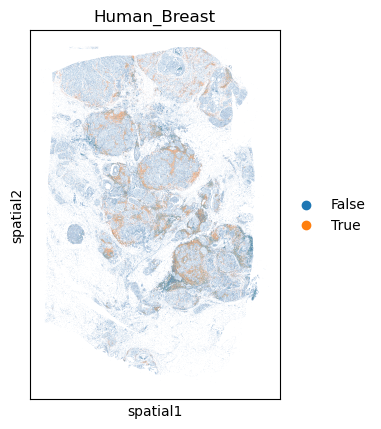

In [10]:
res = 0.75
cd8 = ['1'] #CD8
cd4 = ['19'] #CD4
t_cell_clusts = list(set(cd8 + cd4))
adata.obs['cd8'] = adata.obs[res_label(res)].isin(cd8) 
adata.obs['cd4'] = adata.obs[res_label(res)].isin(cd4)
adata.obs['t_cell'] = adata.obs[res_label(res)].isin(t_cell_clusts) 
sc.pl.spatial(adata, spot_size=5, show=False, title=DATASET_NAME, color='t_cell');

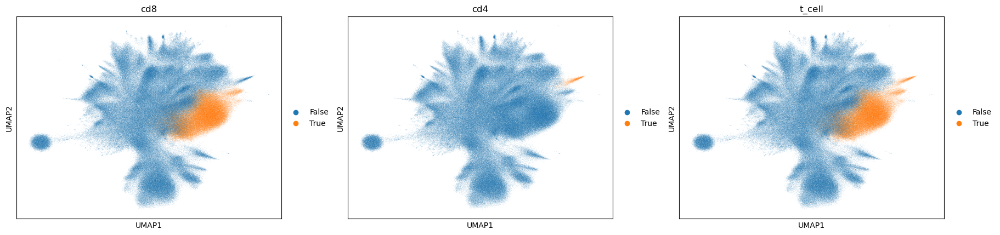

In [11]:
sc.pl.umap(adata, color=['cd8', 'cd4', 't_cell'])

In [12]:
print(f'Not t cell: {sum(~adata.obs['t_cell'])}')
print(f't cell: {sum(adata.obs['t_cell'])}')
print(f'cd8: {sum(adata.obs['cd8'])}')
print(f'cd4: {sum(adata.obs['cd4'])}')

Not t cell: 573060
t cell: 126050
cd8: 123168
cd4: 2882


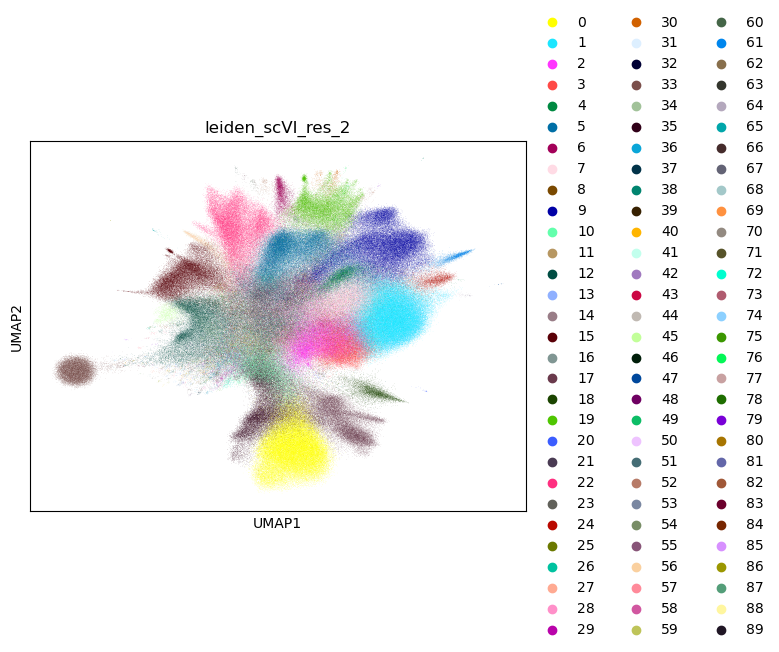

In [13]:
sc.pl.umap(adata, color=[res_label(2)])

In [14]:
def sub_res_label(res, clusters):
    """Order of clusters does not matter"""
    return f'sub_cluster_{"-".join(sorted(clusters))}_res_{res}'

def subcluster(adata, clusters, sub_res, clusters_res_label, de_genes_dict=None):
    print(f'Starting Sub Resolutions {sub_res}')
    new_col_name = sub_res_label(sub_res, clusters)

    # 2. Filter the adata to include only the targeted clusters
    subset_mask = adata.obs[clusters_res_label].isin(clusters)
    adata_sub = adata[subset_mask].copy()

    if new_col_name in adata.obs:
        print(f'{new_col_name} already in adata, skipping')
        # Re-load the existing labels into the subset for DE calculation
        adata_sub.obs[new_col_name] = adata.obs.loc[subset_mask, new_col_name].values
    else:
        # 3. Run the Leiden clustering on the subset
        sc.tl.leiden(adata_sub, resolution=sub_res, key_added=new_col_name, flavor='igraph')
        
        # 4. Initialize the new column in the original adata with "other"
        adata.obs[new_col_name] = "other"
        
        # 5. Map the subset's new cluster results back to the original adata
        adata.obs.loc[subset_mask, new_col_name] = adata_sub.obs[new_col_name].astype(str)
        adata.obs[new_col_name] = adata.obs[new_col_name].astype('category')
    
    # Dot plot base setup
    marker_genes_filt = {
        group: [g for g in genes if g in adata.var_names]
        for group, genes in marker_genes_dotplot.items()
    }
    
    # Compute top DE genes for each new subcluster
    sc.tl.rank_genes_groups(
        adata_sub,
        groupby=new_col_name,
        method='wilcoxon',
        layer='log_norm',
        use_raw=False
    )
    result = adata_sub.uns['rank_genes_groups']
    sub_groups = result['names'].dtype.names
    
    # Add top 10 DE genes per subcluster to the dotplot
    for group in sub_groups:
        top_sub_genes = result['names'][group][:10]
        marker_genes_filt[f'Subcluster {group} Top DE'] = [g for g in top_sub_genes if g in adata.var_names]

    sc.pl.dotplot(
        adata,
        var_names=marker_genes_filt,
        groupby=new_col_name,
        layer='log_norm',
        standard_scale='var',
        title=f'T cell markers & Subcluster DE — {new_col_name}'
    )

    print(f"\nSub-cluster sizes for {new_col_name}:")
    print(adata.obs[new_col_name].value_counts())
    
    return adata

In [15]:
sub_resolutions = [1, 0.75, 0.5, 0.37, 0.25, 0.15, 0.1, 0.05]

starting cd4
Starting Sub Resolutions 1


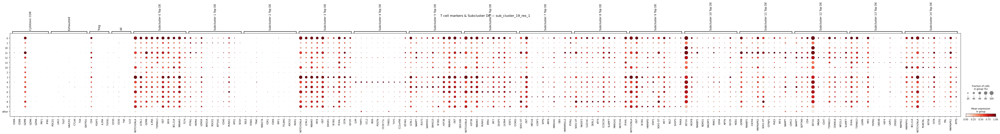


Sub-cluster sizes for sub_cluster_19_res_1:
sub_cluster_19_res_1
other    696228
0           452
2           321
12          299
4           223
10          216
3           212
9           180
8           141
6           138
5           134
1           131
7           123
14          118
13          108
11           86
Name: count, dtype: int64
Starting Sub Resolutions 0.75


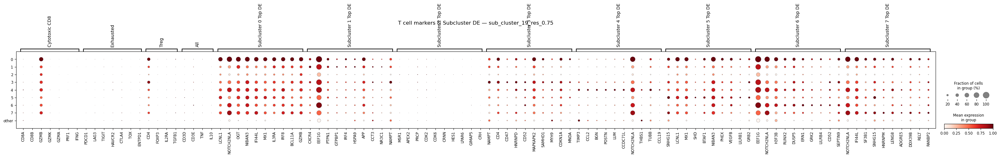


Sub-cluster sizes for sub_cluster_19_res_0.75:
sub_cluster_19_res_0.75
other    696228
0           634
2           426
3           376
1           370
7           358
4           311
6           229
5           178
Name: count, dtype: int64
Starting Sub Resolutions 0.5


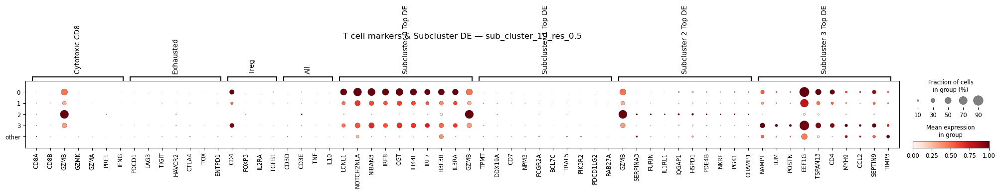


Sub-cluster sizes for sub_cluster_19_res_0.5:
sub_cluster_19_res_0.5
other    696228
1          1379
0          1065
3           382
2            56
Name: count, dtype: int64
Starting Sub Resolutions 0.37


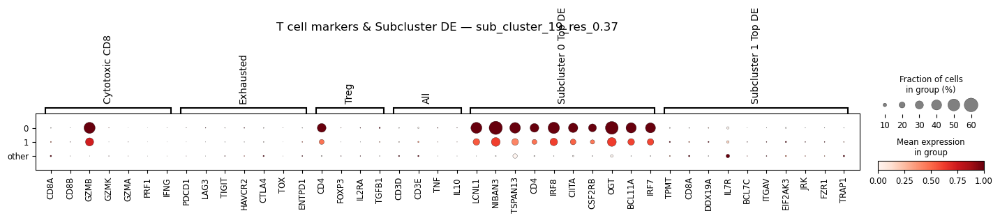


Sub-cluster sizes for sub_cluster_19_res_0.37:
sub_cluster_19_res_0.37
other    696228
1          1466
0          1416
Name: count, dtype: int64
Starting Sub Resolutions 0.25


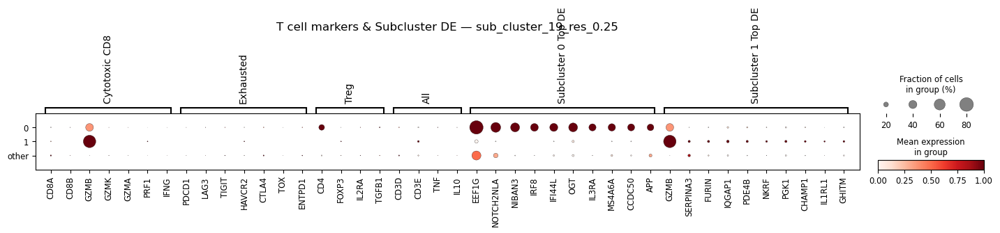


Sub-cluster sizes for sub_cluster_19_res_0.25:
sub_cluster_19_res_0.25
other    696228
0          2827
1            55
Name: count, dtype: int64
Starting Sub Resolutions 0.15


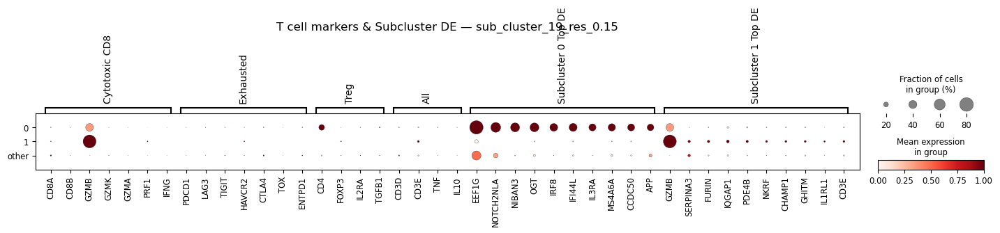


Sub-cluster sizes for sub_cluster_19_res_0.15:
sub_cluster_19_res_0.15
other    696228
0          2831
1            51
Name: count, dtype: int64
Starting Sub Resolutions 0.1


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


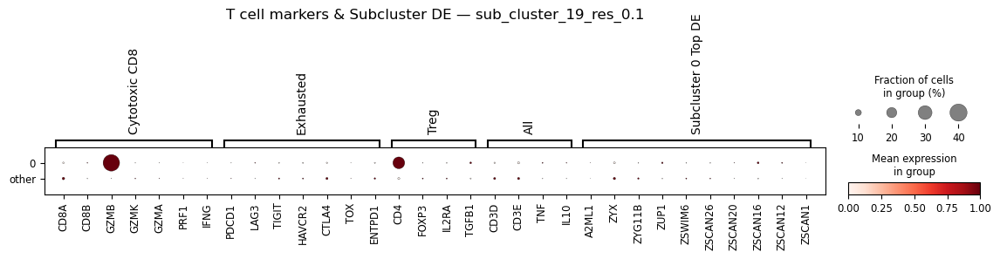


Sub-cluster sizes for sub_cluster_19_res_0.1:
sub_cluster_19_res_0.1
other    696228
0          2882
Name: count, dtype: int64
Starting Sub Resolutions 0.05


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


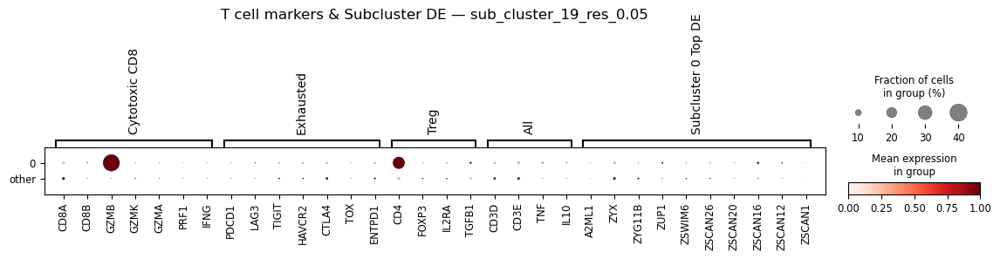


Sub-cluster sizes for sub_cluster_19_res_0.05:
sub_cluster_19_res_0.05
other    696228
0          2882
Name: count, dtype: int64


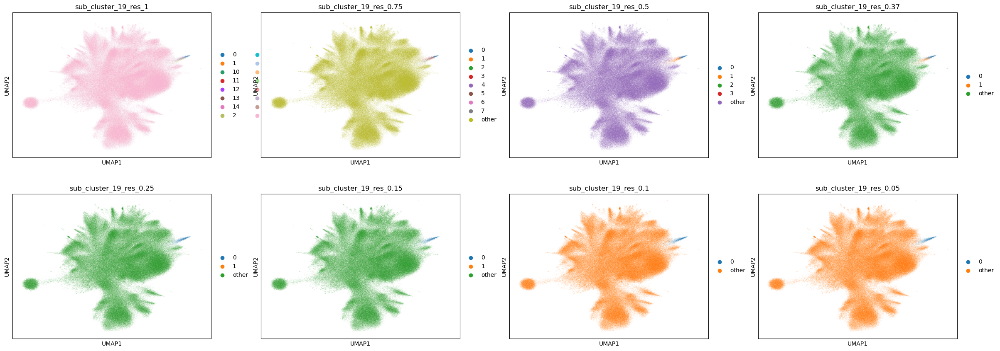

In [16]:
print('starting cd4')
for sub_res in sub_resolutions:
    subcluster(adata, cd4, sub_res, clusters_res_label=res_label(res), de_genes_dict=de_genes_dict)
sc.pl.umap(adata, color=[sub_res_label(sub_res, cd4) for sub_res in sub_resolutions])

starting cd8
Starting Sub Resolutions 1


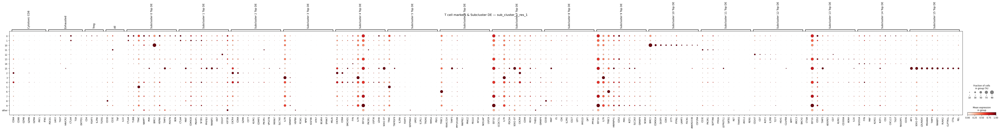


Sub-cluster sizes for sub_cluster_1_res_1:
sub_cluster_1_res_1
other    575942
0         18477
4         18068
9         17228
1         16655
10         7670
13         7637
3          7473
6          6900
2          5701
5          5370
7          3154
11         2803
14         2538
8          2112
12         1372
15           10
Name: count, dtype: int64
Starting Sub Resolutions 0.75


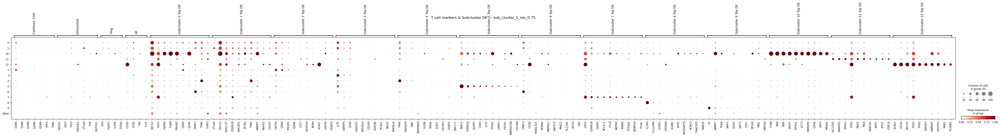


Sub-cluster sizes for sub_cluster_1_res_0.75:
sub_cluster_1_res_0.75
other    575942
0         39347
1         33783
3         14455
6         11226
2         10572
5          8041
4          5446
8           117
9            88
10           65
7            14
11            9
12            5
Name: count, dtype: int64
Starting Sub Resolutions 0.5


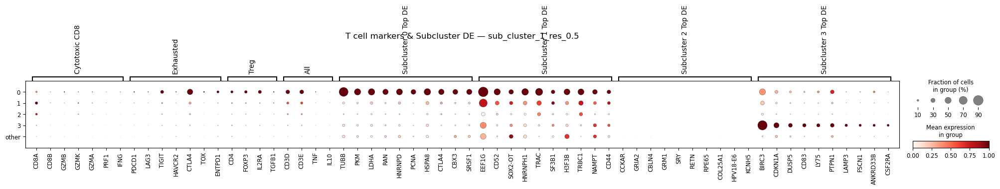


Sub-cluster sizes for sub_cluster_1_res_0.5:
sub_cluster_1_res_0.5
other    575942
1         76555
2         37820
3          7326
0          1467
Name: count, dtype: int64
Starting Sub Resolutions 0.37


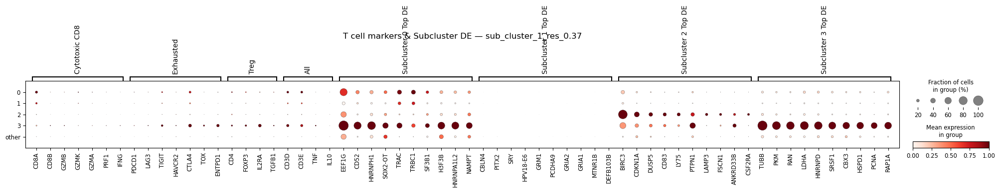


Sub-cluster sizes for sub_cluster_1_res_0.37:
sub_cluster_1_res_0.37
other    575942
0         84614
1         31652
2          6682
3           220
Name: count, dtype: int64
Starting Sub Resolutions 0.25


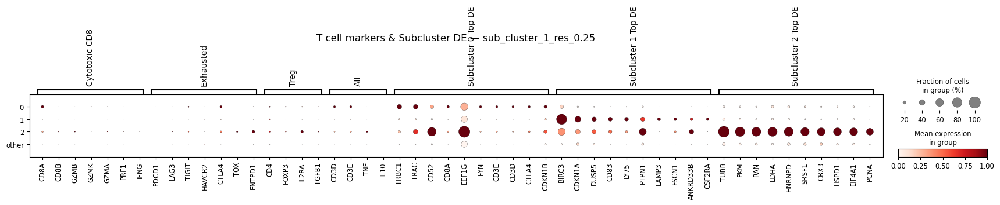


Sub-cluster sizes for sub_cluster_1_res_0.25:
sub_cluster_1_res_0.25
other    575942
0        116704
1          6307
2           157
Name: count, dtype: int64
Starting Sub Resolutions 0.15


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


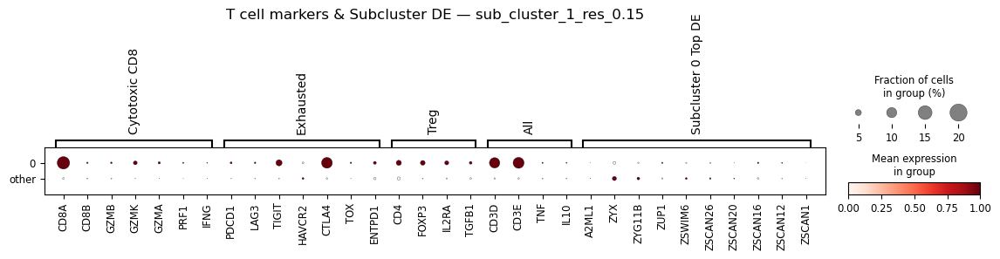


Sub-cluster sizes for sub_cluster_1_res_0.15:
sub_cluster_1_res_0.15
other    575942
0        123168
Name: count, dtype: int64
Starting Sub Resolutions 0.1


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


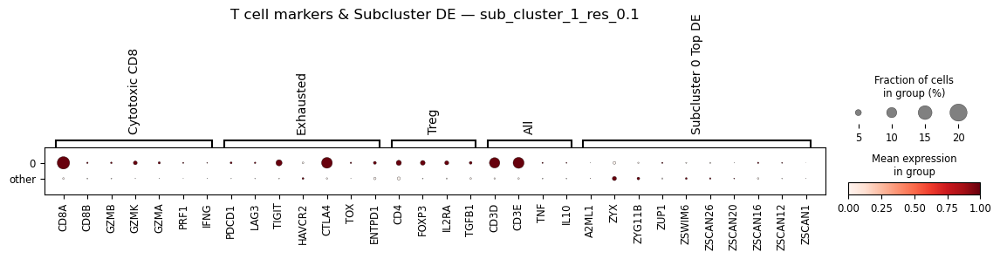


Sub-cluster sizes for sub_cluster_1_res_0.1:
sub_cluster_1_res_0.1
other    575942
0        123168
Name: count, dtype: int64
Starting Sub Resolutions 0.05


/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


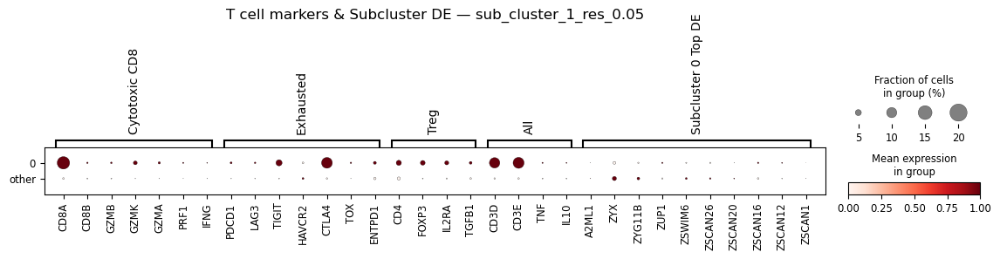


Sub-cluster sizes for sub_cluster_1_res_0.05:
sub_cluster_1_res_0.05
other    575942
0        123168
Name: count, dtype: int64


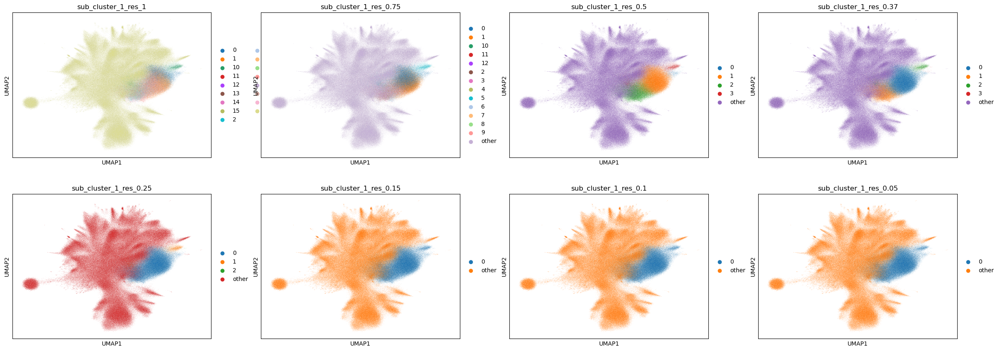

In [17]:
print('starting cd8')
for sub_res in sub_resolutions:
    subcluster(adata, cd8, sub_res, clusters_res_label=res_label(res), de_genes_dict=de_genes_dict)
sc.pl.umap(adata, color=[sub_res_label(sub_res, cd8) for sub_res in sub_resolutions])

In [18]:
# Time to assign

# Tier1
adata.obs['Tier1'] = 'other'
adata.obs.loc[adata.obs['t_cell'], 'Tier1'] = 'T Cell'
adata.obs['Tier1'] = adata.obs['Tier1'].astype('category')

# Tier2
conditions = [
    adata.obs[res_label(res)].isin(cd8),
    adata.obs[res_label(res)].isin(cd4)
]
choices = ['CD8 T Cell', 'CD4 T Cell']
# 2. Use np.select to assign the labels, defaulting to 'other'
adata.obs['Tier2'] = np.select(conditions, choices, default='other')
# 3. Convert to category for optimal memory and Scanpy plotting compatibility
adata.obs['Tier2'] = adata.obs['Tier2'].astype('category')

# Tier3
adata.obs['Tier3'] = 'other'



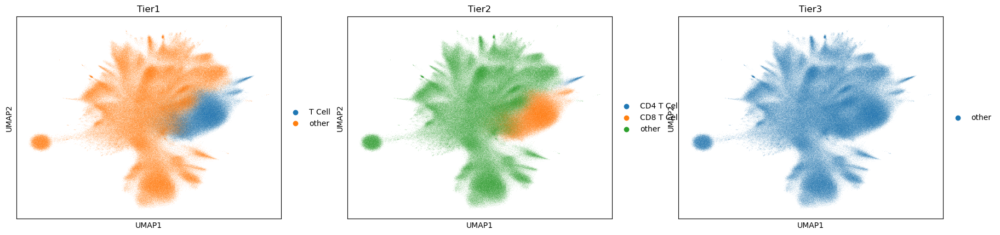

In [19]:
sc.pl.umap(adata, color=['Tier1', 'Tier2', 'Tier3'])

In [20]:
# adata.write_h5ad(f'{DATA_DIR}/adata.h5ad')